In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import Dataset
df = pd.read_csv('Reliance_dataset (2000 -2022 ).csv', encoding="Latin-1")
print('Shape of the data',df.shape)
df.head(10)

Shape of the data (5745, 7)


,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684196,28802010
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060581,61320457
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316597,173426953
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714115,101355113
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096401,128426756
5,2000-01-10,49.110077,49.311222,47.237892,47.733013,36.382896,86714866
6,2000-01-11,47.647915,48.112095,43.919018,44.638493,34.024197,81074352
7,2000-01-12,44.715855,47.191475,43.655979,46.680878,35.580936,78264129
8,2000-01-13,47.346199,48.955353,47.052219,48.251347,36.777977,110363002
9,2000-01-14,47.887741,49.767666,47.887741,48.939880,37.302784,86996234


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5745 entries, 0 to 5744
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       5745 non-null   object 
 1   Open       5745 non-null   float64
 2   High       5745 non-null   float64
 3   Low        5745 non-null   float64
 4   Close      5745 non-null   float64
 5   Adj Close  5745 non-null   float64
 6   Volume     5745 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 314.3+ KB


In [4]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,5745.000000,5745.000000,5745.000000,5745.000000,5745.000000,5.745000e+03
mean,638.461095,646.283828,630.097175,637.879417,615.592614,1.681692e+07
std,679.735287,687.198000,671.907024,679.242266,682.151472,1.809928e+07
min,31.796223,33.962387,30.504259,31.440351,23.964357,0.000000e+00
25%,101.221848,103.666519,99.837044,101.291473,89.115654,6.334809e+06
50%,446.368866,450.975220,440.573792,446.145996,418.400177,1.016516e+07
75%,681.056763,690.801880,668.661743,675.992249,638.090149,2.036854e+07
max,2856.149902,2856.149902,2786.100098,2819.850098,2811.385742,2.918015e+08


In [5]:
df1=df.drop(['Open','High','Low','Adj Close'],axis=1)

In [6]:
df1

,Date,Close,Volume
0,2000-01-03,38.944569,28802010
1,2000-01-04,42.062302,61320457
2,2000-01-05,43.710136,173426953
3,2000-01-06,45.543640,101355113
4,2000-01-07,48.669109,128426756
...,...,...,...
5740,2022-12-26,2524.050049,2764496
5741,2022-12-27,2544.699951,2659749
5742,2022-12-28,2544.449951,3442509
5743,2022-12-29,2543.300049,3198493


In [7]:
df1=df1.rename(columns = {'Close':'Closing Price'})

In [8]:
df1.head()

,Date,Closing Price,Volume
0,2000-01-03,38.944569,28802010
1,2000-01-04,42.062302,61320457
2,2000-01-05,43.710136,173426953
3,2000-01-06,45.543640,101355113
4,2000-01-07,48.669109,128426756


In [9]:
df1.isnull().any()

Date             False
Closing Price    False
Volume           False
dtype: bool

In [10]:
df1.isnull().sum()

Date             0
Closing Price    0
Volume           0
dtype: int64

In [11]:
#Descriptive Analysis

In [12]:
df1.shape

(5745, 3)

In [13]:
#Checking the data types
df1.dtypes

Date              object
Closing Price    float64
Volume             int64
dtype: object

In [14]:
df1['Date'] = pd.to_datetime(df1['Date']) 

In [15]:
df1.dtypes

Date             datetime64[ns]
Closing Price           float64
Volume                    int64
dtype: object

In [16]:
#Unique values for every feature
df1.nunique()

Date             5745
Closing Price    5252
Volume           5689
dtype: int64

In [17]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5745 entries, 0 to 5744
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           5745 non-null   datetime64[ns]
 1   Closing Price  5745 non-null   float64       
 2   Volume         5745 non-null   int64         
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 134.8 KB


In [18]:
df1.describe()

,Closing Price,Volume
count,5745.000000,5.745000e+03
mean,637.879417,1.681692e+07
std,679.242266,1.809928e+07
min,31.440351,0.000000e+00
25%,101.291473,6.334809e+06
50%,446.145996,1.016516e+07
75%,675.992249,2.036854e+07
max,2819.850098,2.918015e+08


In [19]:
#To check if there is any duplicate row/entry

In [20]:
df1[df1.duplicated()] 

,Date,Closing Price,Volume


In [21]:
#Feature Engineering
#Converting the date into months & years

In [22]:
df1['year'] = pd.DatetimeIndex(df1['Date']).year
df1['month'] = pd.DatetimeIndex(df1['Date']).month

In [23]:
df1.head(5).append(df1.tail(5))

,Date,Closing Price,Volume,year,month
0,2000-01-03,38.944569,28802010,2000,1
1,2000-01-04,42.062302,61320457,2000,1
2,2000-01-05,43.710136,173426953,2000,1
3,2000-01-06,45.543640,101355113,2000,1
4,2000-01-07,48.669109,128426756,2000,1
5740,2022-12-26,2524.050049,2764496,2022,12
5741,2022-12-27,2544.699951,2659749,2022,12
5742,2022-12-28,2544.449951,3442509,2022,12
5743,2022-12-29,2543.300049,3198493,2022,12
5744,2022-12-30,2547.199951,3364092,2022,12


In [24]:
#Data Visualization
#Heat Map

(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0.5, 0, 'Closing Price'),
  Text(1.5, 0, 'Volume'),
  Text(2.5, 0, 'year'),
  Text(3.5, 0, 'month')])

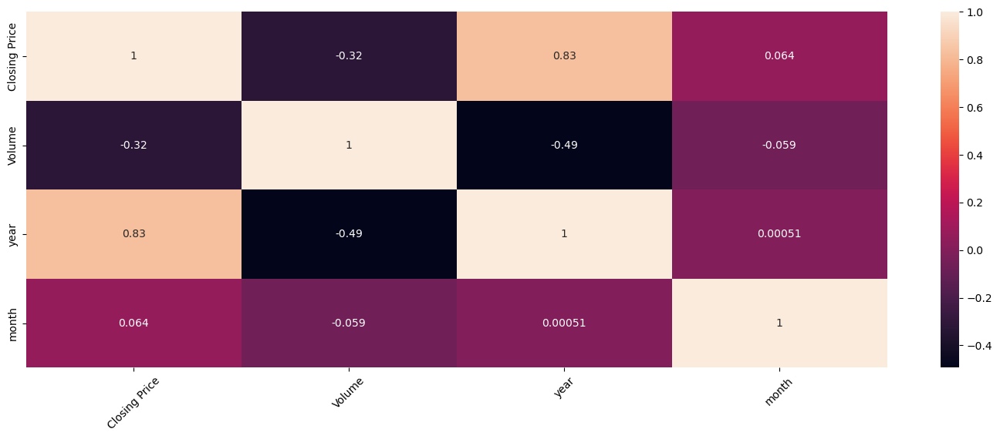

In [25]:
fig= plt.figure(figsize=(18, 6))
sns.heatmap(df1.corr(), annot=True);
plt.xticks(rotation=45)

In [26]:
#Line Plot

<AxesSubplot:title={'center':'Reliance Stock Data Closing Price'}, xlabel='year', ylabel='Closing Price'>

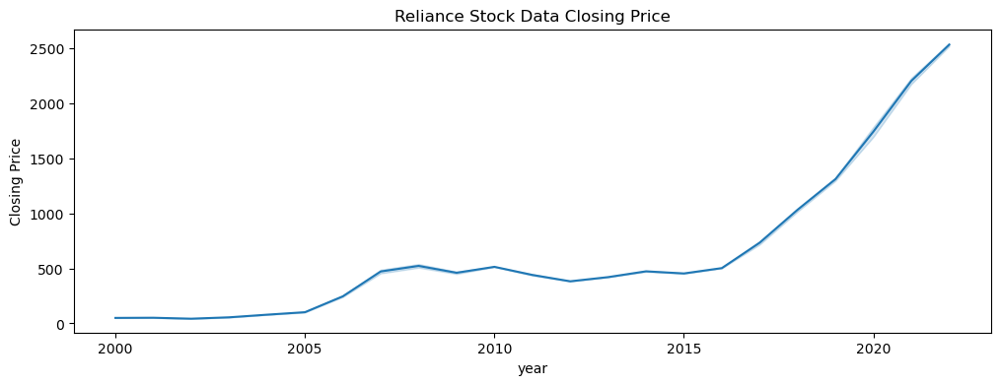

In [27]:
plt.figure(figsize=(12,4))
plt.title('Reliance Stock Data Closing Price')
sns.lineplot(x="year", y="Closing Price", data=df1)

<AxesSubplot:title={'center':'Reliance Stock Volume Data'}, xlabel='year', ylabel='Volume'>

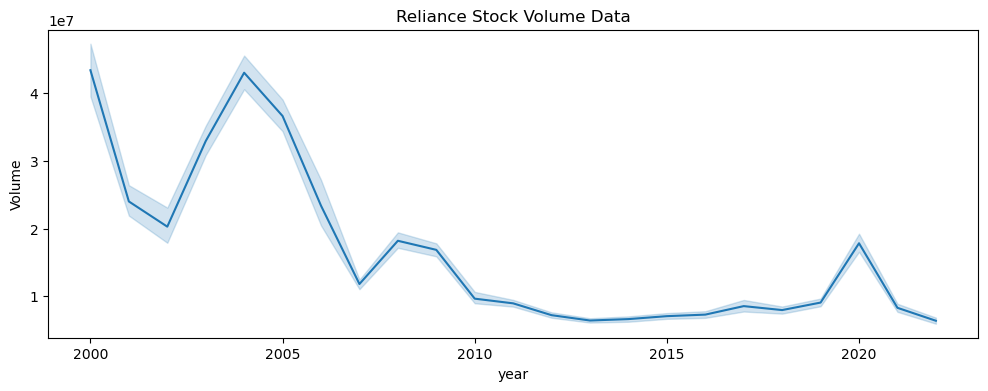

In [28]:
plt.figure(figsize=(12,4))
plt.title('Reliance Stock Volume Data')
sns.lineplot(x="year", y="Volume", data=df1)

#Observation:
#We can see that there is an increasing Trend. So, Trend is not constant.
#Variance is also not constant.
#Hence the time series is not stationary.

In [29]:
#Box Plot

<AxesSubplot:xlabel='year', ylabel='Closing Price'>

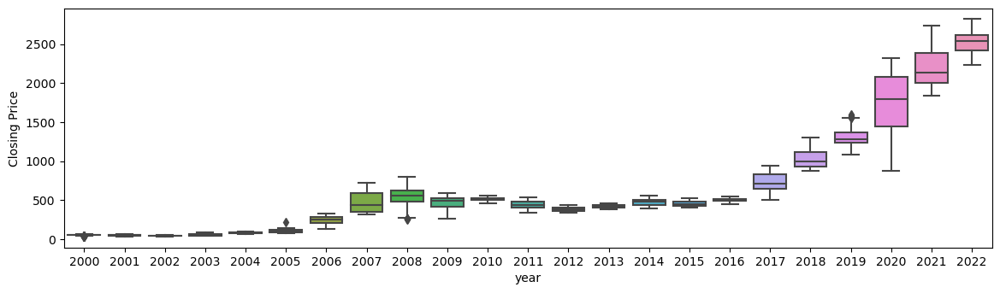

In [30]:
plt.figure(figsize=(14,8))
plt.subplot(212)
sns.boxplot(x="year",y="Closing Price",data=df1)

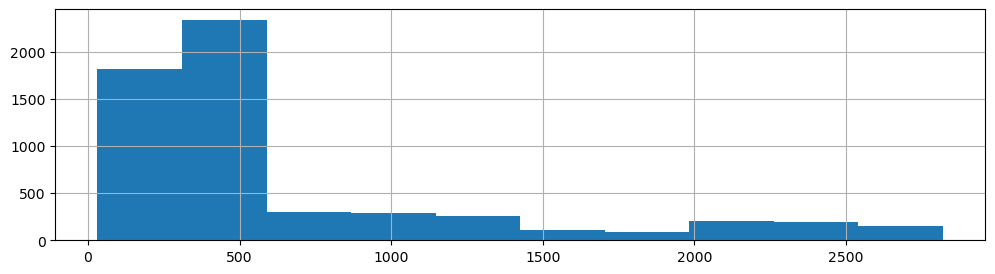

In [31]:
#Histogram and Density Plots
df1['Closing Price'].hist(figsize=(12,3))
plt.show()

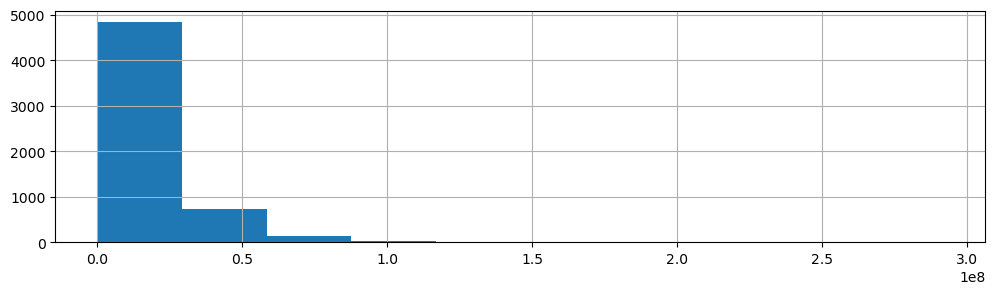

In [32]:
df1['Volume'].hist(figsize=(12,3))
plt.show()

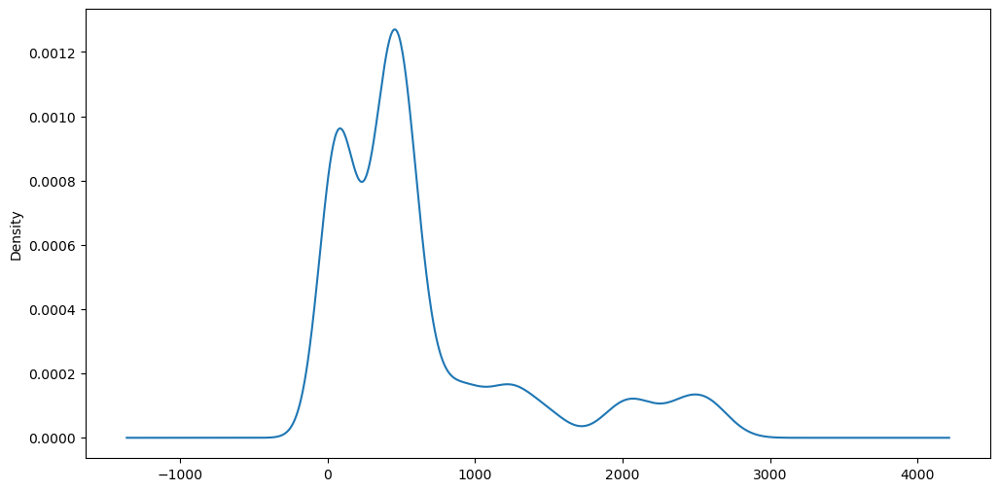

In [33]:
# create a density plot
df1['Closing Price'].plot(kind='kde', figsize=(12,6))
plt.show()

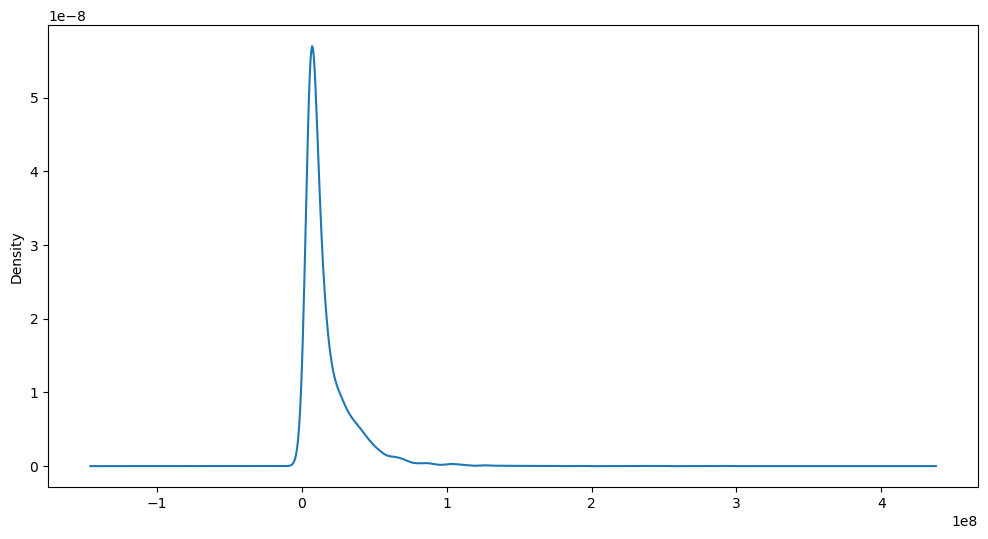

In [34]:
df1['Volume'].plot(kind='kde', figsize=(12,6))
plt.show()

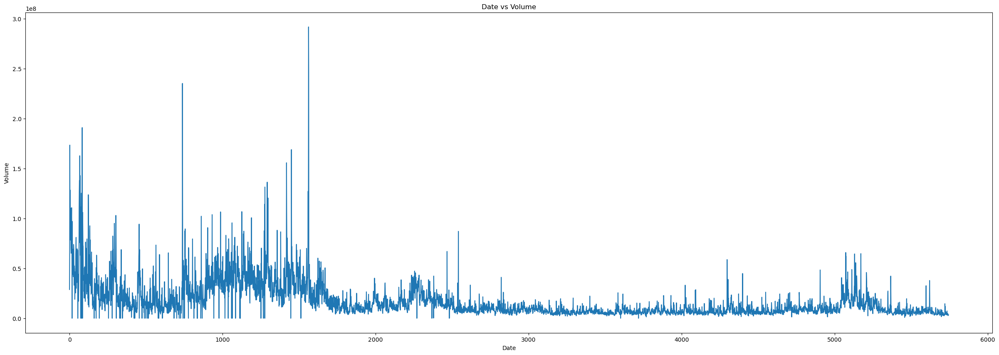

In [35]:
figure=plt.figure(figsize=(30,10))
plt.plot(df1['Volume'])
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Date vs Volume')
plt.show()

In [36]:
# Importing dataset
data=yf.download('RELIANCE.NS', start='2000-1-1', end='2022-12-31').reset_index(drop=False)
reliance_0 = pd.DataFrame(data)


[*********************100%***********************]  1 of 1 completed


In [37]:
reliance_0.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684198,28802010
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060589,61320457
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316589,173426953
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714119,101355113
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096401,128426756
5,2000-01-10,49.110077,49.311222,47.237892,47.733013,36.382900,86714866
6,2000-01-11,47.647915,48.112095,43.919018,44.638493,34.024200,81074352
7,2000-01-12,44.715855,47.191475,43.655979,46.680878,35.580933,78264129
8,2000-01-13,47.346199,48.955353,47.052219,48.251347,36.777981,110363002
9,2000-01-14,47.887741,49.767666,47.887741,48.939880,37.302792,86996234


In [38]:
reliance_0.tail(10)

,Date,Open,High,Low,Close,Adj Close,Volume
5735,2022-12-19,2581.000000,2604.000000,2566.699951,2599.300049,2599.300049,3567363
5736,2022-12-20,2583.899902,2626.000000,2566.000000,2621.800049,2621.800049,3446291
5737,2022-12-21,2621.000000,2633.000000,2576.100098,2584.500000,2584.500000,3935463
5738,2022-12-22,2598.000000,2604.649902,2566.750000,2577.800049,2577.800049,3438692
5739,2022-12-23,2563.300049,2590.500000,2492.250000,2502.199951,2502.199951,4733657
5740,2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2524.050049,2764496
5741,2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2544.699951,2659749
5742,2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,2544.449951,3442509
5743,2022-12-29,2527.000000,2548.899902,2525.500000,2543.300049,2543.300049,3198493
5744,2022-12-30,2545.100098,2577.000000,2541.100098,2547.199951,2547.199951,3364092


In [39]:
# Removing "Adj Close" columnfrom dataset
reliance_1=reliance_0.drop(["Adj Close"],axis=1).reset_index(drop=True)
reliance_1

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756
...,...,...,...,...,...,...
5740,2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2764496
5741,2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2659749
5742,2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,3442509
5743,2022-12-29,2527.000000,2548.899902,2525.500000,2543.300049,3198493


In [40]:
# Finding duplicate columns, if any
reliance_1[reliance_1.duplicated()]

,Date,Open,High,Low,Close,Volume


In [41]:
# Finding null values, if any
reliance_1.isnull().sum()

Date      0
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

In [42]:

#To check which rows have any missing value under any column
reliance_1[reliance_1.isnull().any(axis=1)]

,Date,Open,High,Low,Close,Volume


In [43]:
# Removing the row which have null value
reliance_2=reliance_1.dropna().reset_index(drop=True)
reliance_2

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756
...,...,...,...,...,...,...
5740,2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2764496
5741,2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2659749
5742,2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,3442509
5743,2022-12-29,2527.000000,2548.899902,2525.500000,2543.300049,3198493


In [44]:

# Checking wether if there exist any null values
reliance_2[reliance_2.isnull().any(axis=1)]

,Date,Open,High,Low,Close,Volume


In [45]:
# Making a copy of dataset as reliance
reliance=reliance_2.copy()
reliance

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756
...,...,...,...,...,...,...
5740,2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2764496
5741,2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2659749
5742,2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,3442509
5743,2022-12-29,2527.000000,2548.899902,2525.500000,2543.300049,3198493


In [46]:
reliance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5745 entries, 0 to 5744
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    5745 non-null   datetime64[ns]
 1   Open    5745 non-null   float64       
 2   High    5745 non-null   float64       
 3   Low     5745 non-null   float64       
 4   Close   5745 non-null   float64       
 5   Volume  5745 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 269.4 KB


In [47]:
reliance.describe()

,Open,High,Low,Close,Volume
count,5745.000000,5745.000000,5745.000000,5745.000000,5.745000e+03
mean,638.461095,646.283828,630.097175,637.879417,1.681692e+07
std,679.735287,687.198000,671.907024,679.242266,1.809928e+07
min,31.796223,33.962387,30.504259,31.440351,0.000000e+00
25%,101.221848,103.666519,99.837044,101.291473,6.334809e+06
50%,446.368866,450.975220,440.573792,446.145996,1.016516e+07
75%,681.056763,690.801880,668.661743,675.992249,2.036854e+07
max,2856.149902,2856.149902,2786.100098,2819.850098,2.918015e+08


In [48]:
reliance.corr()

,Open,High,Low,Close,Volume
Open,1.000000,0.999870,0.999861,0.999731,-0.323025
High,0.999870,1.000000,0.999825,0.999892,-0.321129
Low,0.999861,0.999825,1.000000,0.999883,-0.324540
Close,0.999731,0.999892,0.999883,1.000000,-0.322671
Volume,-0.323025,-0.321129,-0.324540,-0.322671,1.000000


In [49]:
# converting the date column in to datetime 
reliance['Date']=pd.to_datetime(reliance['Date'],format='%Y-%m-%d')
reliance

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756
...,...,...,...,...,...,...
5740,2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2764496
5741,2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2659749
5742,2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,3442509
5743,2022-12-29,2527.000000,2548.899902,2525.500000,2543.300049,3198493


In [50]:
# Setting the date column as index
reliance=reliance.set_index('Date')
reliance

,Open,High,Low,Close,Volume
Date,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010
2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457
2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953
2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113
2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756
...,...,...,...,...,...
2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2764496
2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2659749
2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,3442509


Text(0.5, 1.0, 'Low')

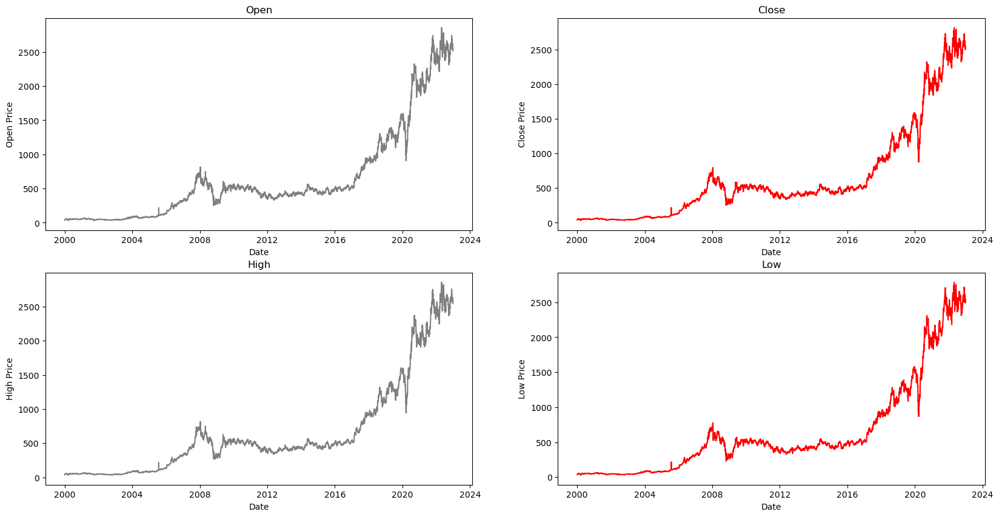

In [51]:
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
plt.plot(reliance['Open'],color='grey')
plt.xlabel('Date')
plt.ylabel('Open Price')
plt.title('Open')
#Plot 2
plt.subplot(2,2,2)
plt.plot(reliance['Close'],color='red')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Close')
#Plot 3
plt.subplot(2,2,3)
plt.plot(reliance['High'],color='grey')
plt.xlabel('Date')
plt.ylabel('High Price')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.plot(reliance['Low'],color='red')
plt.xlabel('Date')
plt.ylabel('Low Price')
plt.title('Low')

Text(0.5, 1.0, 'Low')

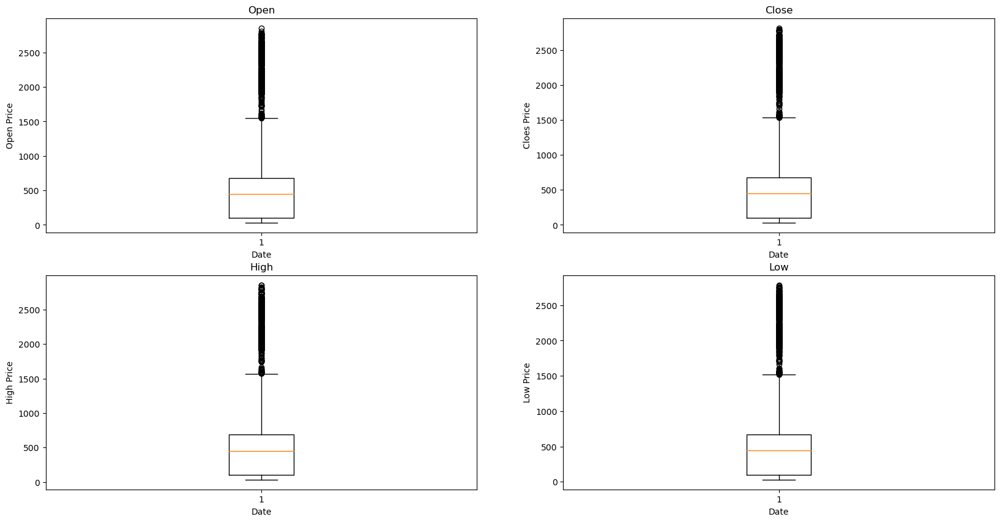

In [52]:
# Creating box-plots
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
plt.boxplot(reliance['Open'])
plt.xlabel('Date')
plt.ylabel('Open Price')
plt.title('Open')
#Plot 2
plt.subplot(2,2,2)
plt.boxplot(reliance['Close'])
plt.xlabel('Date')
plt.ylabel('Cloes Price')
plt.title('Close')
#Plot 3
plt.subplot(2,2,3)
plt.boxplot(reliance['High'])
plt.xlabel('Date')
plt.ylabel('High Price')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.boxplot(reliance['Low'])
plt.xlabel('Date')
plt.ylabel('Low Price')
plt.title('Low')

Text(0.5, 1.0, 'Low')

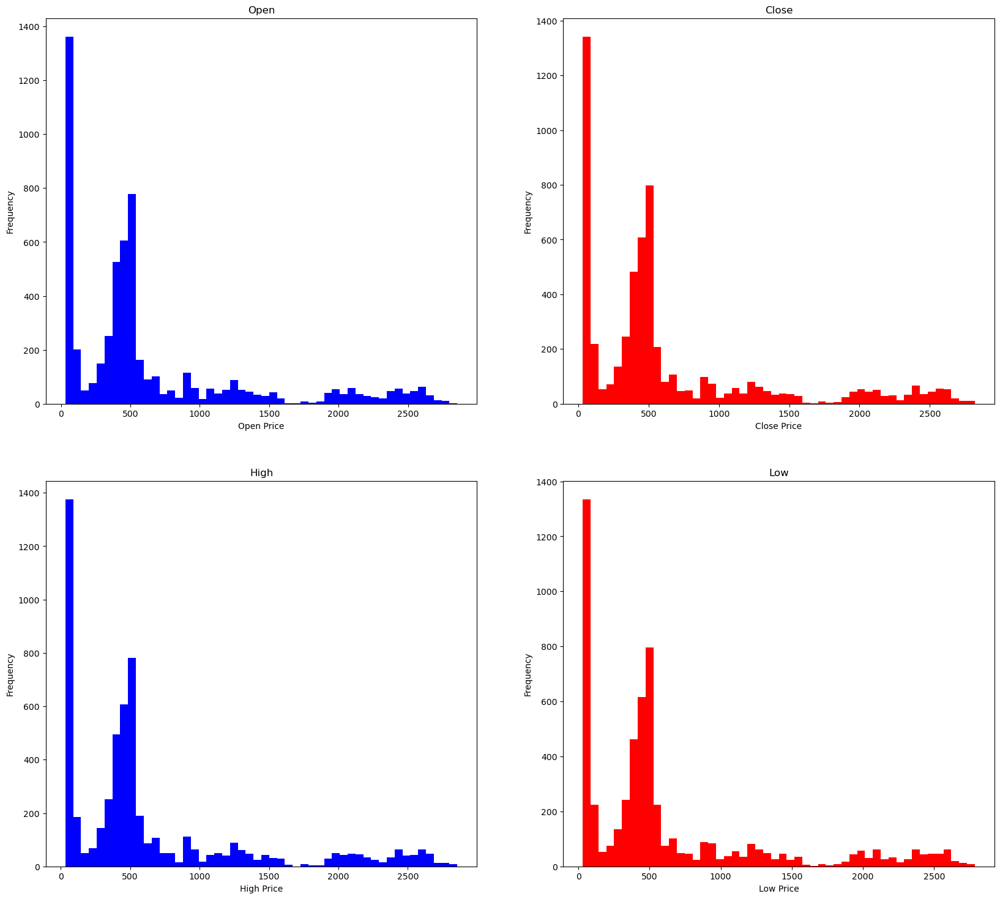

In [53]:
# Ploting Histogram
plt.figure(figsize=(20,18))
#Plot 1
plt.subplot(2,2,1)
plt.hist(reliance['Open'],bins=50, color='blue')
plt.xlabel("Open Price")
plt.ylabel("Frequency")
plt.title('Open')
#Plot 2
plt.subplot(2,2,2)
plt.hist(reliance['Close'],bins=50, color='red')
plt.xlabel("Close Price")
plt.ylabel("Frequency")
plt.title('Close')
#Plot 3
plt.subplot(2,2,3)
plt.hist(reliance['High'],bins=50, color='blue')
plt.xlabel("High Price")
plt.ylabel("Frequency")
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.hist(reliance['Low'],bins=50, color='red')
plt.xlabel("Low Price")
plt.ylabel("Frequency")
plt.title('Low')

Text(0.5, 1.0, 'Low')

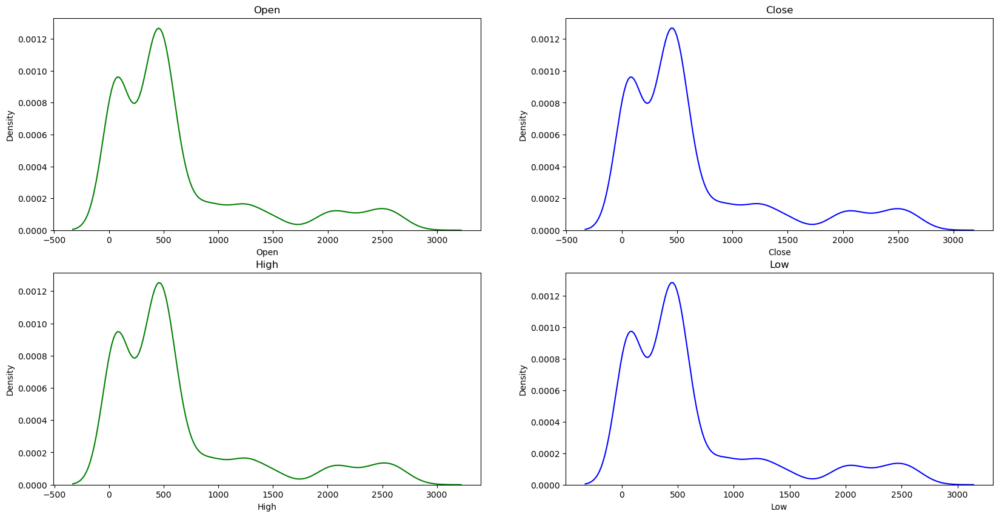

In [54]:
# KDE-Plots
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
sns.kdeplot(reliance['Open'], color='green')
plt.title('Open')
#Plot 2
plt.subplot(2,2,2)
sns.kdeplot(reliance['Close'], color='blue')
plt.title('Close')
#Plot 3
plt.subplot(2,2,3)
sns.kdeplot(reliance['High'], color='green')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
sns.kdeplot(reliance['Low'], color='blue')
plt.title('Low')

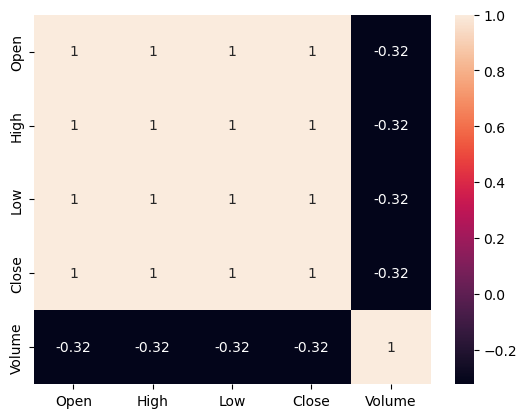

In [55]:
sns.heatmap(reliance.corr(),annot=True)
plt.show()

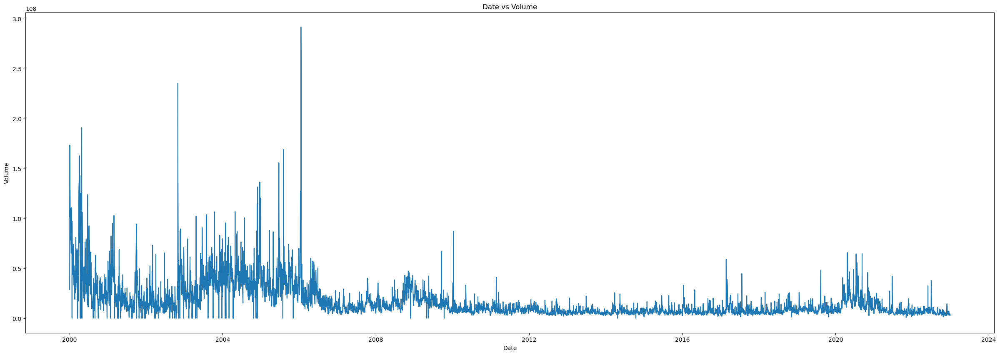

In [56]:
figure=plt.figure(figsize=(30,10))
plt.plot(reliance['Volume'])
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Date vs Volume')
plt.show()

In [57]:
#Finding long-term and short-term trends
#Moving Average

In [58]:
reliance_ma=reliance.copy()
reliance_ma['30-day MA']=reliance['Close'].rolling(window=30).mean()
reliance_ma['200-day MA']=reliance['Close'].rolling(window=200).mean()

In [59]:
reliance_ma

,Open,High,Low,Close,Volume,30-day MA,200-day MA
Date,,,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010,NaN,NaN
2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457,NaN,NaN
2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953,NaN,NaN
2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113,NaN,NaN
2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756,NaN,NaN
...,...,...,...,...,...,...,...
2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2764496,2618.376693,2556.113508
2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2659749,2616.290023,2557.659508
2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,3442509,2614.693351,2558.611257


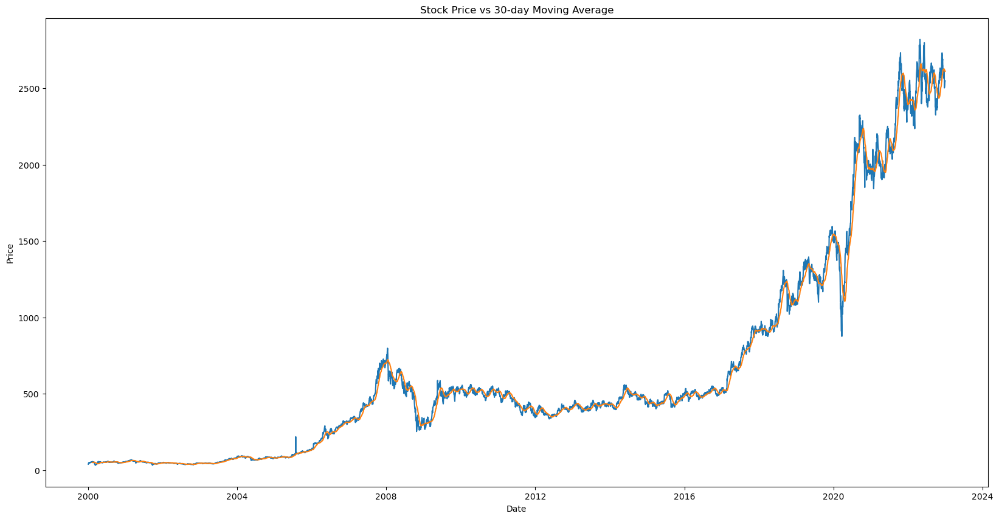

In [60]:
plt.figure(figsize=(20,10))
plt.plot(reliance_ma['Close'],label='Original data')
plt.plot(reliance_ma['30-day MA'],label='30-MA')
plt.legend
plt.title('Stock Price vs 30-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

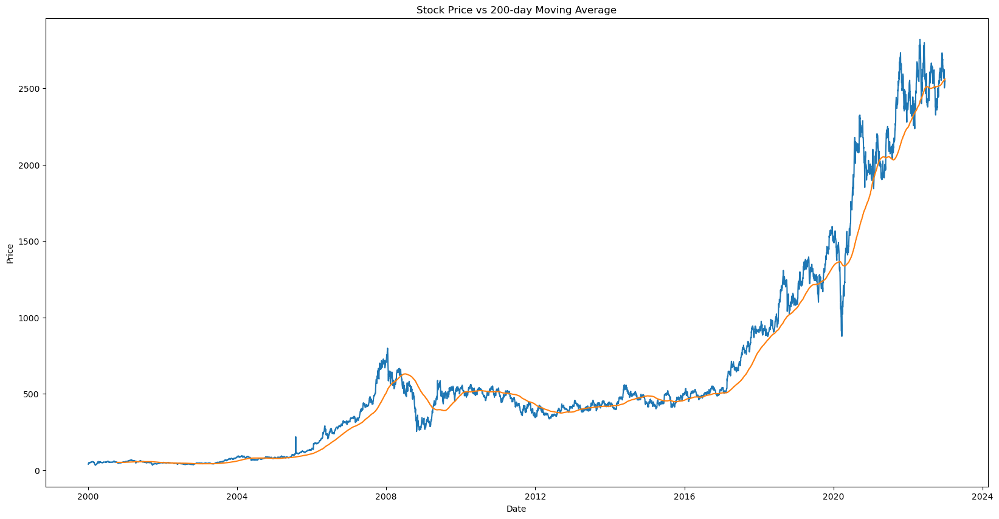

In [61]:
plt.figure(figsize=(20,10))
plt.plot(reliance_ma['Close'],label='Original data')
plt.plot(reliance_ma['200-day MA'],label='200-MA')
plt.legend
plt.title('Stock Price vs 200-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

In [62]:
#Long term and short term trends can be identified using the Moving Average graphs

#In long term, Stock price is in upward trend
#Short term trends can be identified from MA-30 chart
#Stock had a major short term downtrend during the year 2020
#It may be due to the bearish market during the Covid-19 outbraek

In [63]:
#MODEL BUILDING

In [64]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM, GRU

from itertools import cycle

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [65]:
reliance

,Open,High,Low,Close,Volume
Date,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010
2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457
2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953
2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113
2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756
...,...,...,...,...,...
2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2764496
2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2659749
2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,3442509


In [66]:
# Creating dataframe which only includes date and close time

close_df=pd.DataFrame(reliance['Close'])
close_df

,Close
Date,
2000-01-03,38.944569
2000-01-04,42.062302
2000-01-05,43.710136
2000-01-06,45.543640
2000-01-07,48.669109
...,...
2022-12-26,2524.050049
2022-12-27,2544.699951
2022-12-28,2544.449951


In [67]:
print(close_df.shape)

(5745, 1)


In [68]:
close_df=close_df.reset_index()

In [69]:
close_df['Date']

0      2000-01-03
1      2000-01-04
2      2000-01-05
3      2000-01-06
4      2000-01-07
          ...    
5740   2022-12-26
5741   2022-12-27
5742   2022-12-28
5743   2022-12-29
5744   2022-12-30
Name: Date, Length: 5745, dtype: datetime64[ns]

In [75]:
close_df

,Close
0,38.944569
1,42.062302
2,43.710136
3,45.543640
4,48.669109
...,...
5740,2524.050049
5741,2544.699951
5742,2544.449951
5743,2543.300049


In [70]:
#Normalizing / scaling close value between 0 to 1

In [77]:
close_stock = close_df.copy()
del close_df['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(close_df).reshape(-1,1))
print(closedf.shape)

KeyError: 'Date'

In [78]:
np.array(close_df)

array([[  38.94456863],
       [  42.06230164],
       [  43.71013641],
       ...,
       [2544.44995117],
       [2543.30004883],
       [2547.19995117]])

In [79]:
closedf

array([[0.00269122],
       [0.00380932],
       [0.00440028],
       ...,
       [0.90123398],
       [0.90082159],
       [0.9022202 ]])

In [80]:
#Split data for training and testing
#Ratio for training and testing data is 86:14

In [81]:
training_size=int(len(closedf)*0.90)
test_size=len(closedf)-training_size
train_data,test_data=closedf[0:training_size,:],closedf[training_size:len(closedf),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (5170, 1)
test_data:  (575, 1)


In [82]:
#Create new dataset according to requirement of time-series prediction

In [83]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [84]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 13
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (5156, 13)
y_train:  (5156,)
X_test:  (561, 13)
y_test (561,)


In [85]:
X_test

array([[0.76384389, 0.81858832, 0.82065043, ..., 0.78875054, 0.77096259,
        0.77831445],
       [0.81858832, 0.82065043, 0.81448205, ..., 0.77096259, 0.77831445,
        0.7835325 ],
       [0.82065043, 0.81448205, 0.8203277 , ..., 0.77831445, 0.7835325 ,
        0.79386098],
       ...,
       [0.93881814, 0.92441929, 0.9258538 , ..., 0.91319423, 0.88608197,
        0.89391801],
       [0.92441929, 0.9258538 , 0.93012143, ..., 0.88608197, 0.89391801,
        0.90132363],
       [0.9258538 , 0.93012143, 0.92671447, ..., 0.89391801, 0.90132363,
        0.90123398]])

In [77]:
#Algorithms
#Support vector regression - SVR

In [78]:
import math
from sklearn.svm import SVR

svr_rbf = SVR(kernel= 'rbf', C= 1e3, gamma= 0.01)
svr_rbf.fit(X_train, y_train)

SVR(C=1000.0, gamma=0.01)

In [79]:
 #Lets Do the prediction 

train_predict=svr_rbf.predict(X_train)
test_predict=svr_rbf.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5156, 1)
Test data prediction: (561, 1)


In [80]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

In [81]:
#Evaluation metrices RMSE, MSE and MAE
#Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [82]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  176.14490933271964
Train data MSE:  31027.02908383202
Test data MAE:  165.41964435165428
-------------------------------------------------------------------------------------
Test data RMSE:  143.41373890643493
Test data MSE:  20567.500507123088
Test data MAE:  121.42180570300944


In [83]:
#Explained variance regression score
#The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [84]:
#R2 score for regression
#R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

#1 = Best

#0 or < 0 = worse

In [85]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9664945657818536
Test data explained variance regression score: 0.8938479251899667


In [86]:
train_r2_svr=r2_score(original_ytrain, train_predict)
test_r2_svr=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_svr)
print("Test data R2 score:", test_r2_svr)

Train data R2 score: 0.7973623827639107
Test data R2 score: 0.6820678534224472


In [87]:
#Comparision between original stock close price vs predicted close price

In [88]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5745, 1)
Test predicted data:  (5745, 1)


In [89]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = svr_rbf.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = svr_rbf.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


In [90]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [91]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


In [92]:
svrdf=closedf.tolist()
svrdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
svrdf=scaler.inverse_transform(svrdf).reshape(1,-1).tolist()[0]

names = cycle(['Close Price'])

fig = px.line(svrdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [93]:
#Random Forest Regressor - RF

In [94]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=0)

In [95]:
# Lets Do the prediction 

train_predict=regressor.predict(X_train)
test_predict=regressor.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5156, 1)
Test data prediction: (561, 1)


In [96]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

In [97]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  5.052378375037841
Train data MSE:  25.52652724455001
Test data MAE:  2.711100551688084
-------------------------------------------------------------------------------------
Test data RMSE:  346.4127322211493
Test data MSE:  120001.78104492169
Test data MAE:  289.3526930821603


In [98]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9998332881816852
Test data explained variance regression score: -0.003721883268080539


In [99]:
train_r2_rf=r2_score(original_ytrain, train_predict)
test_r2_rf=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_rf)
print("Test data R2 score:", test_r2_rf)

Train data R2 score: 0.9998332861762829
Test data R2 score: -0.8549859195349578


In [100]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5745, 1)
Test predicted data:  (5745, 1)


In [101]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = regressor.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = regressor.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))


Output of predicted next days:  30


In [102]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [103]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [104]:
rfdf=closedf.tolist()
rfdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
rfdf=scaler.inverse_transform(rfdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(rfdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [105]:
#K-nearest neighgbour - KNN

In [106]:
from sklearn import neighbors

K = time_step
neighbor = neighbors.KNeighborsRegressor(n_neighbors = K)
neighbor.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=13)

In [107]:
# Lets Do the prediction 

train_predict=neighbor.predict(X_train)
test_predict=neighbor.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5156, 1)
Test data prediction: (561, 1)


In [108]:
# Lets Do the prediction 

train_predict=neighbor.predict(X_train)
test_predict=neighbor.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5156, 1)
Test data prediction: (561, 1)


In [109]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

In [110]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  15.625285843309701
Train data MSE:  244.14955768513457
Test data MAE:  8.218109494128646
-------------------------------------------------------------------------------------
Test data RMSE:  332.40198357559444
Test data MSE:  110491.07868498974
Test data MAE:  277.2280936262726


In [111]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9984055652313604
Test data explained variance regression score: 0.054625566600037034


In [112]:
train_r2_knn=r2_score(original_ytrain, train_predict)
test_r2_knn=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_knn)
print("Test data R2 score:", test_r2_knn)

Train data R2 score: 0.9984054585282759
Test data R2 score: -0.7079696102023703


In [113]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


Train predicted data:  (5745, 1)
Test predicted data:  (5745, 1)


In [114]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = neighbor.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = neighbor.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


In [115]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [116]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [117]:
knndf=closedf.tolist()
knndf.extend((np.array(lst_output).reshape(-1,1)).tolist())
knndf=scaler.inverse_transform(knndf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(knndf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [118]:
#LSTM

In [119]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (5156, 13, 1)
X_test:  (561, 13, 1)


# LSTM model structure

In [121]:
tf.keras.backend.clear_session()
model_f=Sequential()
model_f.add(LSTM(32,return_sequences=True,input_shape=(time_step,1)))
model_f.add(LSTM(32,return_sequences=True))
model_f.add(LSTM(32))
model_f.add(Dense(1))
model_f.compile(loss='mean_squared_error',optimizer='adam')

In [122]:
model_f.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=100,batch_size=32,verbose=1)

Epoch 1/100
162/162 [==============================] - 18s 39ms/step - loss: 0.0016 - val_loss: 0.0018
Epoch 2/100
162/162 [==============================] - 4s 27ms/step - loss: 1.7285e-04 - val_loss: 0.0014
Epoch 3/100
162/162 [==============================] - 4s 25ms/step - loss: 1.7234e-04 - val_loss: 0.0017
Epoch 4/100
162/162 [==============================] - 4s 24ms/step - loss: 1.5366e-04 - val_loss: 0.0021
Epoch 5/100
162/162 [==============================] - 4s 27ms/step - loss: 1.5275e-04 - val_loss: 0.0011
Epoch 6/100
162/162 [==============================] - 4s 25ms/step - loss: 1.3535e-04 - val_loss: 0.0012
Epoch 7/100
162/162 [==============================] - 4s 26ms/step - loss: 1.4207e-04 - val_loss: 0.0020
Epoch 8/100
162/162 [==============================] - 4s 27ms/step - loss: 1.4327e-04 - val_loss: 0.0024
Epoch 9/100
162/162 [==============================] - 4s 26ms/step - loss: 1.3125e-04 - val_loss: 0.0020
Epoch 10/100
162/162 [===========================

In [140]:
X_test


array([[[0.76384389],
        [0.81858832],
        [0.82065043],
        ...,
        [0.78875054],
        [0.77096259],
        [0.77831445]],

       [[0.81858832],
        [0.82065043],
        [0.81448205],
        ...,
        [0.77096259],
        [0.77831445],
        [0.7835325 ]],

       [[0.82065043],
        [0.81448205],
        [0.8203277 ],
        ...,
        [0.77831445],
        [0.7835325 ],
        [0.79386098]],

       ...,

       [[0.93881814],
        [0.92441929],
        [0.9258538 ],
        ...,
        [0.91319423],
        [0.88608197],
        [0.89391801]],

       [[0.92441929],
        [0.9258538 ],
        [0.93012143],
        ...,
        [0.88608197],
        [0.89391801],
        [0.90132363]],

       [[0.9258538 ],
        [0.93012143],
        [0.92671447],
        ...,
        [0.89391801],
        [0.90132363],
        [0.90123398]]])

In [123]:
### Lets Do the prediction and check performance metrics
train_predict=model_f.predict(X_train)
test_predict=model_f.predict(X_test)
train_predict.shape, test_predict.shape

18/18 [==============================] - 0s 8ms/step


((5156, 1), (561, 1))

In [124]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

In [125]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("train data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  19.838006253277598
Train data MSE:  393.54649210508114
train data MAE:  12.81640785844683
-------------------------------------------------------------------------------------
Test data RMSE:  56.73502855980309
Test data MSE:  3218.8634656816726
Test data MAE:  46.52467147636754


In [126]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9979878410585561
Test data explained variance regression score: 0.9736801571174689


In [127]:
train_r2_lstm=r2_score(original_ytrain, train_predict)
test_r2_lstm=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_lstm)
print("Test data R2 score:", test_r2_lstm)

Train data R2 score: 0.9974297467148296
Test data R2 score: 0.950242851783093


In [128]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)
 
# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5745, 1)
Test predicted data:  (5745, 1)


In [129]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = model_f.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model_f.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


In [130]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [131]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


In [132]:
# Fetch the historical data for Reliance
reliance = yf.download("RELIANCE.NS", start="2023-01-01", end="2023-01-15")
reliance

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-01-02,2550.000000,2579.000000,2548.199951,2575.899902,2575.899902,2453414
2023-01-03,2565.050049,2573.000000,2547.800049,2557.050049,2557.050049,3534596
2023-01-04,2557.000000,2561.050049,2514.000000,2518.550049,2518.550049,4275746
2023-01-05,2523.500000,2536.399902,2504.000000,2514.050049,2514.050049,6293519
2023-01-06,2526.649902,2547.949951,2518.300049,2536.899902,2536.899902,2930338
2023-01-09,2545.300049,2602.000000,2543.350098,2596.800049,2596.800049,4948549
2023-01-10,2606.000000,2606.000000,2546.000000,2558.399902,2558.399902,3713755
2023-01-11,2552.500000,2558.000000,2521.100098,2526.149902,2526.149902,5311657
2023-01-12,2524.850098,2532.500000,2465.000000,2471.600098,2471.600098,8163366


In [133]:
df1

,Date,Closing Price,Volume,year,month
0,2000-01-03,38.944569,28802010,2000,1
1,2000-01-04,42.062302,61320457,2000,1
2,2000-01-05,43.710136,173426953,2000,1
3,2000-01-06,45.543640,101355113,2000,1
4,2000-01-07,48.669109,128426756,2000,1
...,...,...,...,...,...
5740,2022-12-26,2524.050049,2764496,2022,12
5741,2022-12-27,2544.699951,2659749,2022,12
5742,2022-12-28,2544.449951,3442509,2022,12
5743,2022-12-29,2543.300049,3198493,2022,12


In [134]:
lstmdf=closedf.tolist()
lstmdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
lstmdf=scaler.inverse_transform(lstmdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(lstmdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [135]:
#Conclusion Chart

In [136]:
names = cycle(['SVR', 'RF','KNN','LSTM'])

fig = px.line(finaldf[225:], x=finaldf.index[225:], y=[finaldf['svr'][225:],finaldf['rf'][225:], finaldf['knn'][225:], 
                                          finaldf['lstm'][225:],],
             labels={'x': 'Timestamp','value':'Stock close price'})
fig.update_layout(title_text='Final stock analysis chart', font_size=15, font_color='black',legend_title_text='Algorithms')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

NameError: name 'finaldf' is not defined

In [137]:
data={"Model": ["SVR", "Random Forest", "KNN", "LSTM"],
    "Train R2 Score": [train_r2_svr, train_r2_rf,train_r2_knn, train_r2_lstm],
    "Test R2 Score": [test_r2_svr, test_r2_rf, test_r2_knn, test_r2_lstm]}
df=pd.DataFrame(data)
df

,Model,Train R2 Score,Test R2 Score
0,SVR,0.797362,0.682068
1,Random Forest,0.999833,-0.854986
2,KNN,0.998405,-0.707970
3,LSTM,0.997430,0.950243


In [138]:
#R2 score for regression
#R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

#1 = Best

#0 or < 0 = worse

In [139]:
#By Looking into this table we can say that our LSTM model have best R2 score.
#so we are going to use LSTM model for our deployment part.

In [ ]:
import pickle
pickle_out= open('LSTM_model_f.pkl','wb')
pickle.dump(model_f, pickle_out)
pickle_out.close()